# Credit Card Approval Dataset Analysis

Credit score cards are a common risk control method in the financial industry. It uses personal information and data submitted by credit card applicants to predict the probability of future defaults and credit card borrowings. The bank is able to decide whether to issue a credit card to the applicant. Credit scores can objectively quantify the magnitude of risk.

This dataset's objective is predicting whether an applicant's credit card approval will be approved or not. The dataset contains applicants' basic information and applicants' credit history

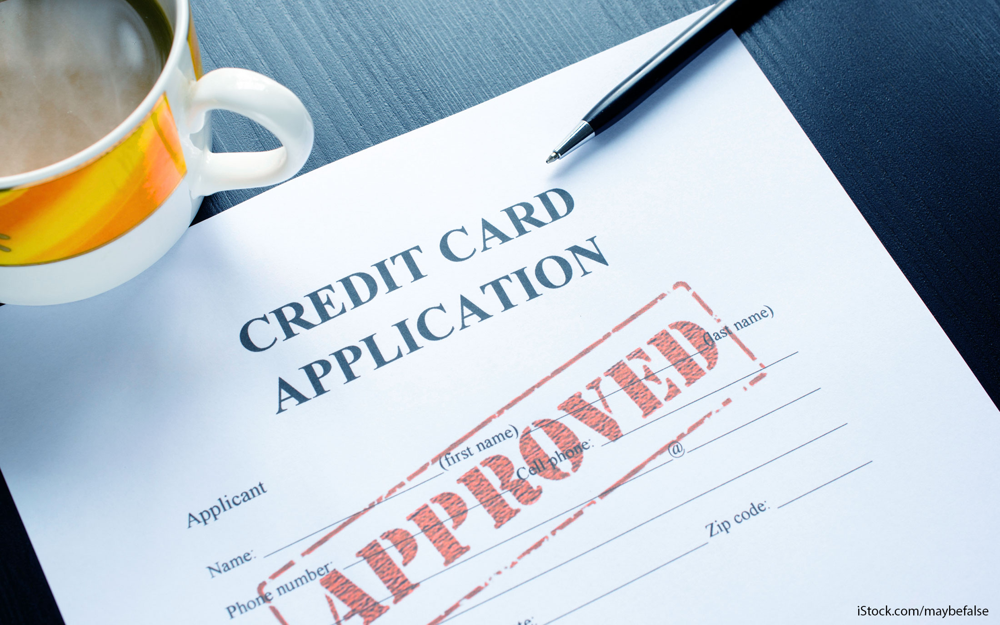

## Data Information

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
import plotly.graph_objects as go
import plotly.express as px
import plotly as pl

In [2]:
#Import the 1st dataset - Application information
df= pd.read_csv("C:/Users/hp/Desktop/Learning/ML Projects/CC Pred/application_record.csv")

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 438557 entries, 0 to 438556
Data columns (total 18 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   ID                   438557 non-null  int64  
 1   CODE_GENDER          438557 non-null  object 
 2   FLAG_OWN_CAR         438557 non-null  object 
 3   FLAG_OWN_REALTY      438557 non-null  object 
 4   CNT_CHILDREN         438557 non-null  int64  
 5   AMT_INCOME_TOTAL     438557 non-null  float64
 6   NAME_INCOME_TYPE     438557 non-null  object 
 7   NAME_EDUCATION_TYPE  438557 non-null  object 
 8   NAME_FAMILY_STATUS   438557 non-null  object 
 9   NAME_HOUSING_TYPE    438557 non-null  object 
 10  DAYS_BIRTH           438557 non-null  int64  
 11  DAYS_EMPLOYED        438557 non-null  int64  
 12  FLAG_MOBIL           438557 non-null  int64  
 13  FLAG_WORK_PHONE      438557 non-null  int64  
 14  FLAG_PHONE           438557 non-null  int64  
 15  FLAG_EMAIL       

In [4]:
df.isnull().sum()

ID                          0
CODE_GENDER                 0
FLAG_OWN_CAR                0
FLAG_OWN_REALTY             0
CNT_CHILDREN                0
AMT_INCOME_TOTAL            0
NAME_INCOME_TYPE            0
NAME_EDUCATION_TYPE         0
NAME_FAMILY_STATUS          0
NAME_HOUSING_TYPE           0
DAYS_BIRTH                  0
DAYS_EMPLOYED               0
FLAG_MOBIL                  0
FLAG_WORK_PHONE             0
FLAG_PHONE                  0
FLAG_EMAIL                  0
OCCUPATION_TYPE        134203
CNT_FAM_MEMBERS             0
dtype: int64

In [5]:
n = len(pd.unique(df['ID']))
n

438510

In [6]:
#Import 2nd dataset - Credit record of applicants
credit= pd.read_csv("C:/Users/hp/Desktop/Learning/ML Projects/CC Pred/credit_record.csv")

In [7]:
credit.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1048575 entries, 0 to 1048574
Data columns (total 3 columns):
 #   Column          Non-Null Count    Dtype 
---  ------          --------------    ----- 
 0   ID              1048575 non-null  int64 
 1   MONTHS_BALANCE  1048575 non-null  int64 
 2   STATUS          1048575 non-null  object
dtypes: int64(2), object(1)
memory usage: 24.0+ MB


In [8]:
m = len(pd.unique(credit['ID']))
m

45985

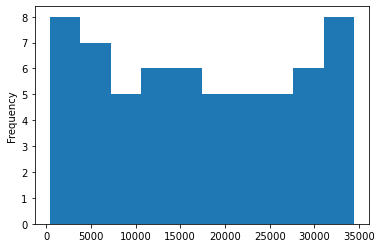

In [9]:
credit.MONTHS_BALANCE.value_counts().plot.hist()
plt.show()

Grouping the credit data by ID and then merging the data with the application by using left inner join.

In [10]:
credit['MONTHS_BALANCE'] = credit.MONTHS_BALANCE.apply(lambda x : x*(-1))
time = pd.DataFrame(credit.groupby('ID').agg({'MONTHS_BALANCE' : max}))
time.rename(columns = {'MONTHS_BALANCE':'CUST_LIFE'},inplace = True)

In [11]:
data = pd.merge(df,time,on = 'ID',how='inner')
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 36457 entries, 0 to 36456
Data columns (total 19 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   ID                   36457 non-null  int64  
 1   CODE_GENDER          36457 non-null  object 
 2   FLAG_OWN_CAR         36457 non-null  object 
 3   FLAG_OWN_REALTY      36457 non-null  object 
 4   CNT_CHILDREN         36457 non-null  int64  
 5   AMT_INCOME_TOTAL     36457 non-null  float64
 6   NAME_INCOME_TYPE     36457 non-null  object 
 7   NAME_EDUCATION_TYPE  36457 non-null  object 
 8   NAME_FAMILY_STATUS   36457 non-null  object 
 9   NAME_HOUSING_TYPE    36457 non-null  object 
 10  DAYS_BIRTH           36457 non-null  int64  
 11  DAYS_EMPLOYED        36457 non-null  int64  
 12  FLAG_MOBIL           36457 non-null  int64  
 13  FLAG_WORK_PHONE      36457 non-null  int64  
 14  FLAG_PHONE           36457 non-null  int64  
 15  FLAG_EMAIL           36457 non-null 

#### The status of the credit data represents: 
    0: 1-29 days past due
    1: 30-59 days past due 
    2: 60-89 days overdue 
    3: 90-119 days overdue 
    4: 120-149 days overdue 
    5: Overdue or bad debts, write-offs for more than 150 days 
    C: paid off that month 
    X: No loan for the month

###### This means that the applicants with C and X are not at fault whereas the others are defaulters.

#### Sorting and combining the Credit data with the application record

In [12]:
#Replacing the variables X and C with an integer 6 (Non-Defaulters)
credit['STATUS'][credit['STATUS']=='X'] =6
credit['STATUS'][credit['STATUS']=='C'] =6

<ipython-input-12-4149b4c5d3d1>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  credit['STATUS'][credit['STATUS']=='X'] =6
<ipython-input-12-4149b4c5d3d1>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  credit['STATUS'][credit['STATUS']=='C'] =6


In [13]:
credit['STATUS']= credit.STATUS.apply(lambda x : int(x))

In [14]:
credit.sort_values(by = 'STATUS',ascending = False,inplace = True)
credit.drop_duplicates(subset = ['ID'],inplace = True)

In [15]:
credit['target']= credit.STATUS.apply(lambda x : 0 if x==6 else 1)
credit.drop(['STATUS','MONTHS_BALANCE'],axis = 1,inplace = True)
credit['target'].value_counts()

0    39887
1     6098
Name: target, dtype: int64

In [16]:
data= pd.merge(data, credit, on= "ID",how= "inner")

In [17]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 36457 entries, 0 to 36456
Data columns (total 20 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   ID                   36457 non-null  int64  
 1   CODE_GENDER          36457 non-null  object 
 2   FLAG_OWN_CAR         36457 non-null  object 
 3   FLAG_OWN_REALTY      36457 non-null  object 
 4   CNT_CHILDREN         36457 non-null  int64  
 5   AMT_INCOME_TOTAL     36457 non-null  float64
 6   NAME_INCOME_TYPE     36457 non-null  object 
 7   NAME_EDUCATION_TYPE  36457 non-null  object 
 8   NAME_FAMILY_STATUS   36457 non-null  object 
 9   NAME_HOUSING_TYPE    36457 non-null  object 
 10  DAYS_BIRTH           36457 non-null  int64  
 11  DAYS_EMPLOYED        36457 non-null  int64  
 12  FLAG_MOBIL           36457 non-null  int64  
 13  FLAG_WORK_PHONE      36457 non-null  int64  
 14  FLAG_PHONE           36457 non-null  int64  
 15  FLAG_EMAIL           36457 non-null 

Remove the duplicates of the data if there exist any.

In [18]:
data.drop_duplicates(subset =['ID',
 'CODE_GENDER',
 'FLAG_OWN_CAR',
 'FLAG_OWN_REALTY',
 'CNT_CHILDREN',
 'AMT_INCOME_TOTAL',
 'NAME_INCOME_TYPE',
 'NAME_EDUCATION_TYPE',
 'NAME_FAMILY_STATUS',
 'NAME_HOUSING_TYPE',
 'DAYS_BIRTH',
 'DAYS_EMPLOYED',
 'FLAG_MOBIL',
 'FLAG_WORK_PHONE',
 'FLAG_PHONE',
 'FLAG_EMAIL',
 'OCCUPATION_TYPE',
 'CNT_FAM_MEMBERS',
 'CUST_LIFE',
 'target'] ,inplace = True)
data.shape

(36457, 20)

## Eploratory Data Analysis

In this segment, we can understand the dataset and see the impacts of different factors on the Target variable, i.e., the status of the credit record by using different techniques of visualization.

0    31407
1     5050
Name: target, dtype: int64


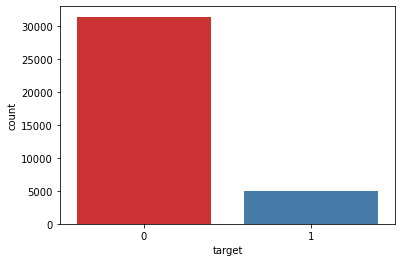

In [19]:
# 0 - Non - Defaulters
# 1 - Defaulters
print(data['target'].value_counts())
sns.countplot(x='target', data=data, palette='Set1')
plt.show()

We can see that the data of approval is unbalanced where the dafaulter data is lesser than non-defaulters.

Text(0, 0.5, 'Number of Defaulters')

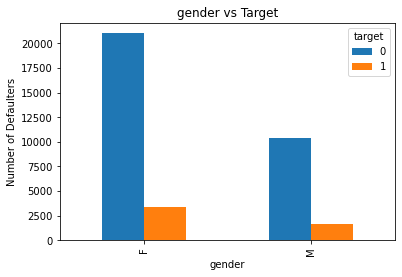

In [20]:
#Target v/s Gender
pd.crosstab(data.CODE_GENDER,data.target).plot(kind='bar')
plt.title('gender vs Target')
plt.xlabel('gender')
plt.ylabel('Number of Defaulters')

Text(0, 0.5, 'Number of Defaulters')

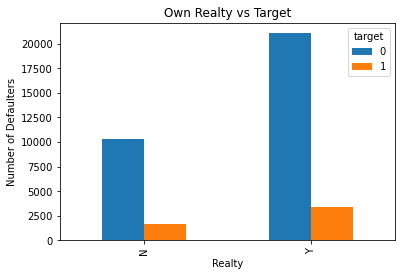

In [21]:
#Own realty V/s Target
pd.crosstab(data.FLAG_OWN_REALTY,data.target).plot(kind='bar')
plt.title('Own Realty vs Target')
plt.xlabel('Realty')
plt.ylabel('Number of Defaulters')

The data being unbalanced depicts that there are more female non-defaulters and more non-defaulters with their own realty.

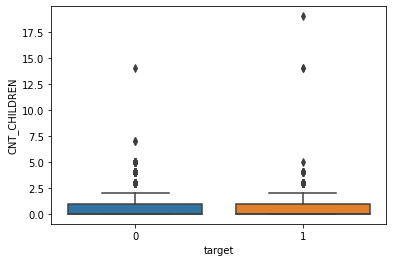

In [22]:
#Finding the outliers of the children count.
sns.boxplot(x="target", y="CNT_CHILDREN", data=data)
plt.show()

In [23]:
# Income histogram to check the distribution
a = data['AMT_INCOME_TOTAL']

fig = go.Figure()
fig.add_trace(
    go.Histogram(x=a,
                marker=dict(color='rgba(114, 186, 59, 0.5)'))
)
fig.add_shape(
        go.layout.Shape(type='line', xref='x', yref='paper',
                        x0=a.mean(), y0=0, x1=a.mean(), y1=0.9, line={'dash': 'dash'}),
)
fig.show()
print("Skewness of age is", data['AMT_INCOME_TOTAL'].skew())

Skewness of age is 2.739009876253129


Text(0, 0.5, 'Number of Defaulters')

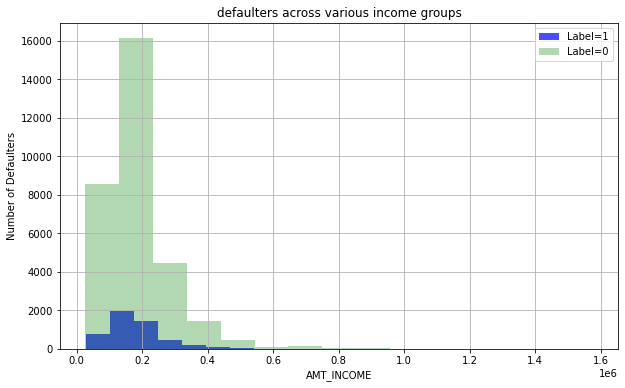

In [24]:
plt.figure(figsize=(10,6))
data[data['target']==1]['AMT_INCOME_TOTAL'].hist(alpha=0.7,color='blue',
                                              bins=15,label='Label=1')
data[data['target']==0]['AMT_INCOME_TOTAL'].hist(alpha=0.3,color='green',
                                                bins=15,label='Label=0')
                                                    
plt.title('defaulters across various income groups')                                                    
plt.legend()
plt.xlabel('AMT_INCOME')
plt.ylabel('Number of Defaulters')

Both the count of children and income contain outliers which are default values of an individual. The defaulters lie mainly in the income groups of 0 to 0.6.

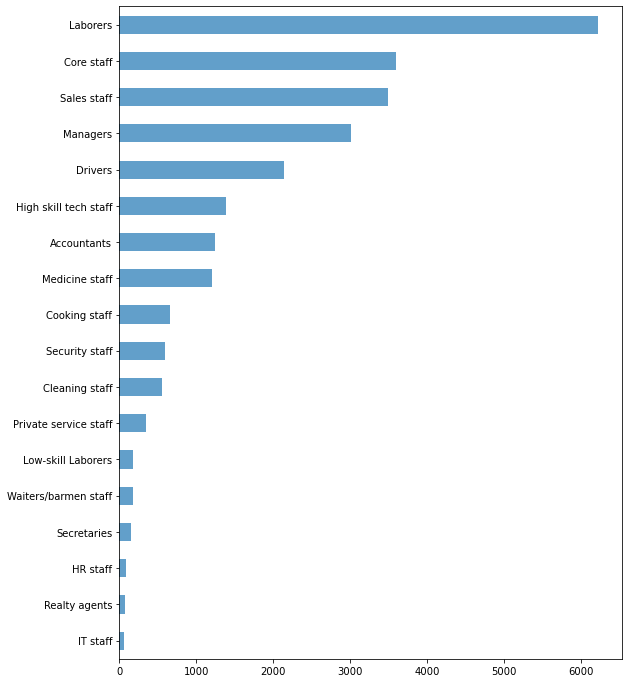

In [25]:
data['OCCUPATION_TYPE'].value_counts().sort_values().plot(kind='barh', figsize=(9,12), alpha=0.7)

Text(0, 0.5, 'number of defaulters')

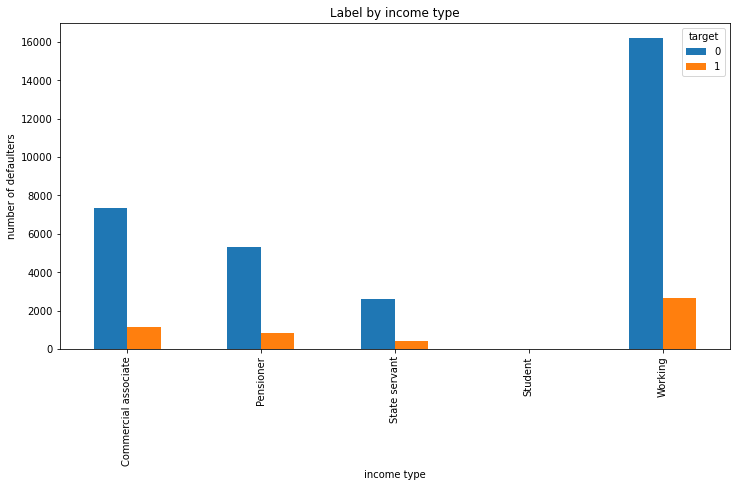

In [26]:
#Income Type v/s Target
pd.crosstab(data.NAME_INCOME_TYPE, data.target).plot(kind='bar', figsize=(12,6))
plt.title('Label by income type')
plt.xlabel('income type')
plt.ylabel('number of defaulters')

The working class get more of their credit cards approved from the bank as compared to others, while students being the least individuals getting credit card approval.

Text(0.5, 1.0, 'FAMILY_STATUS versus Target')

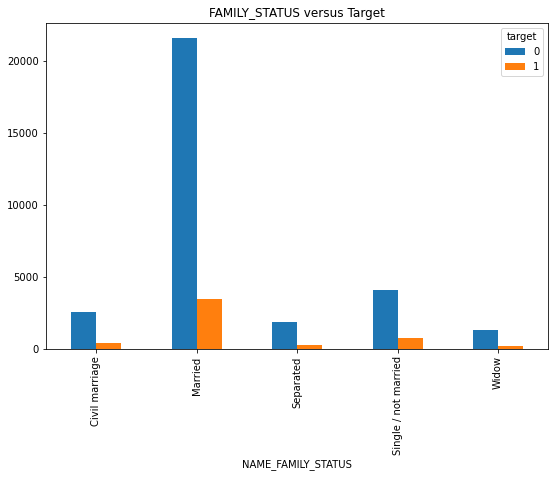

In [27]:
#Family Status v/s Target
pd.crosstab(data.NAME_FAMILY_STATUS, data.target).plot(kind='bar', figsize=(9,6))
plt.title('FAMILY_STATUS versus Target')

The married get more of their credits approved from the bank as compared to others, and are seen to be the majority defaulters of the bank.

Text(0.5, 1.0, 'HOUSING_TYPE versus Target')

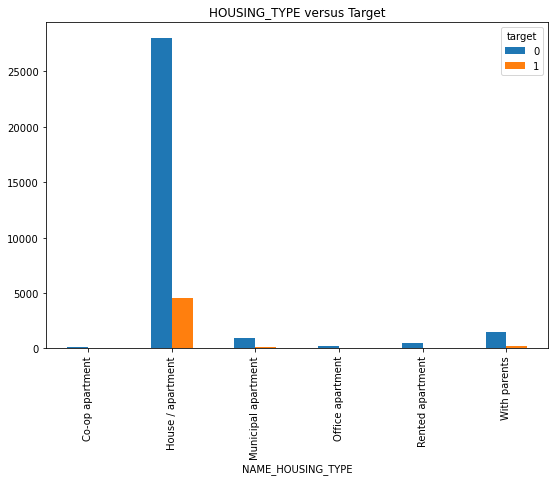

In [28]:
#Type of housing v/s Target
pd.crosstab(data.NAME_HOUSING_TYPE, data.target).plot(kind='bar', figsize=(9,6))
plt.title('HOUSING_TYPE versus Target')

The people with own houses are main creditors and also the majority defaulters. 

Text(0, 0.5, 'number of users')

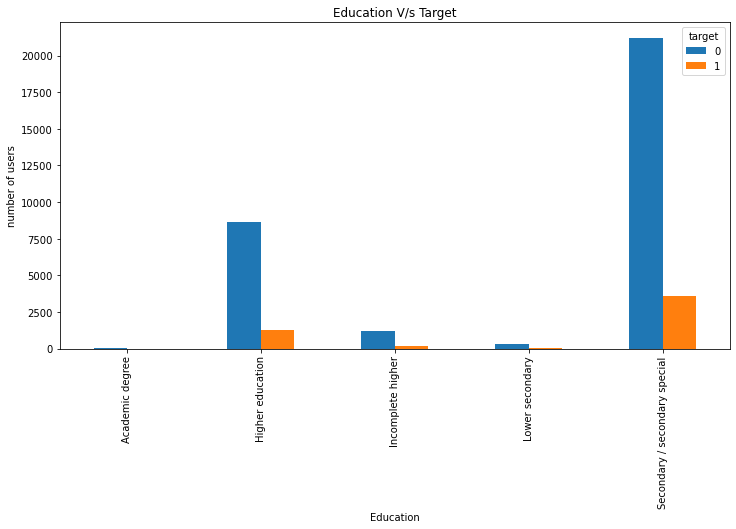

In [29]:
pd.crosstab(data.NAME_EDUCATION_TYPE, data.target).plot(kind='bar', figsize=(12,6))
plt.title('Education V/s Target')
plt.xlabel('Education')
plt.ylabel('number of users')

Approval of credit cards for people with more education is more as compared to those with lesser education.

## Data Cleaning and Transformation

In [30]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 36457 entries, 0 to 36456
Data columns (total 20 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   ID                   36457 non-null  int64  
 1   CODE_GENDER          36457 non-null  object 
 2   FLAG_OWN_CAR         36457 non-null  object 
 3   FLAG_OWN_REALTY      36457 non-null  object 
 4   CNT_CHILDREN         36457 non-null  int64  
 5   AMT_INCOME_TOTAL     36457 non-null  float64
 6   NAME_INCOME_TYPE     36457 non-null  object 
 7   NAME_EDUCATION_TYPE  36457 non-null  object 
 8   NAME_FAMILY_STATUS   36457 non-null  object 
 9   NAME_HOUSING_TYPE    36457 non-null  object 
 10  DAYS_BIRTH           36457 non-null  int64  
 11  DAYS_EMPLOYED        36457 non-null  int64  
 12  FLAG_MOBIL           36457 non-null  int64  
 13  FLAG_WORK_PHONE      36457 non-null  int64  
 14  FLAG_PHONE           36457 non-null  int64  
 15  FLAG_EMAIL           36457 non-null 

In [31]:
data['DAYS_BIRTH'].describe()

count    36457.000000
mean    -15975.173382
std       4200.549944
min     -25152.000000
25%     -19438.000000
50%     -15563.000000
75%     -12462.000000
max      -7489.000000
Name: DAYS_BIRTH, dtype: float64

In [32]:
data['DAYS_EMPLOYED'].describe()

count     36457.000000
mean      59262.935568
std      137651.334859
min      -15713.000000
25%       -3153.000000
50%       -1552.000000
75%        -408.000000
max      365243.000000
Name: DAYS_EMPLOYED, dtype: float64

The Birth data contains the age of the users in days format subtracted from the present date. The same applies for the employement data. This data needs to be cleaned by converting the data into positives and then dividing to convert into years.

In [33]:
x = len(data['DAYS_EMPLOYED'][data['DAYS_EMPLOYED']>0])
x

6135

In [34]:
x = len(data['NAME_INCOME_TYPE'][data['NAME_INCOME_TYPE'] == 'Pensioner'])
x

6152

The pensioners are most of the people whose age is not been defined properly.

In [35]:
data['DAYS_EMPLOYED'] = data['DAYS_EMPLOYED'].apply(lambda x : x*-1)
data['DAYS_EMPLOYED'].describe()

count     36457.000000
mean     -59262.935568
std      137651.334859
min     -365243.000000
25%         408.000000
50%        1552.000000
75%        3153.000000
max       15713.000000
Name: DAYS_EMPLOYED, dtype: float64

In [36]:
data['DAYS_BIRTH'] = data['DAYS_BIRTH'].apply(lambda x : x*-1)
data['DAYS_BIRTH'].describe()

count    36457.000000
mean     15975.173382
std       4200.549944
min       7489.000000
25%      12462.000000
50%      15563.000000
75%      19438.000000
max      25152.000000
Name: DAYS_BIRTH, dtype: float64

### Converting the age and employement time in years and classifying them into bins

In [37]:
data['YEARS_EM'] = data.DAYS_EMPLOYED/365
data['AGE'] = data.DAYS_BIRTH/365

In [38]:
data.drop(["DAYS_BIRTH","DAYS_EMPLOYED"],axis = 1,inplace = True)

In [39]:
data['YEARS_EM'] = data.YEARS_EM.apply(lambda x : 0 if x<0 else x)
data.head()

,ID,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,FLAG_MOBIL,FLAG_WORK_PHONE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,CUST_LIFE,target,YEARS_EM,AGE
0,5008804,M,Y,Y,0,427500.0,Working,Higher education,Civil marriage,Rented apartment,1,1,0,0,NaN,2.0,15,0,12.443836,32.890411
1,5008805,M,Y,Y,0,427500.0,Working,Higher education,Civil marriage,Rented apartment,1,1,0,0,NaN,2.0,14,0,12.443836,32.890411
2,5008806,M,Y,Y,0,112500.0,Working,Secondary / secondary special,Married,House / apartment,1,0,0,0,Security staff,2.0,29,0,3.106849,58.832877
3,5008808,F,N,Y,0,270000.0,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,1,0,1,1,Sales staff,1.0,4,0,8.358904,52.356164
4,5008809,F,N,Y,0,270000.0,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,1,0,1,1,Sales staff,1.0,26,0,8.358904,52.356164


In [40]:
x = len(data['YEARS_EM'][data['YEARS_EM']<0])
x

0

In [41]:
data['AGE'].describe()

count    36457.000000
mean        43.767598
std         11.508356
min         20.517808
25%         34.142466
50%         42.638356
75%         53.254795
max         68.909589
Name: AGE, dtype: float64

Text(0, 0.5, 'Number of users')

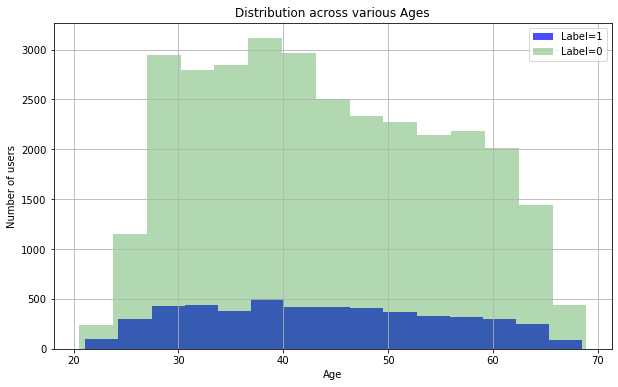

In [42]:
#Distribution of Defaulters across various age groups
plt.figure(figsize=(10,6))
data[data['target']==1]['AGE'].hist(alpha=0.7,color='blue',
                                              bins=15,label='Label=1')
data[data['target']==0]['AGE'].hist(alpha=0.3,color='green',
                                                bins=15,label='Label=0')
                                                    
plt.title('Distribution across various Ages')                                                    
plt.legend()
plt.xlabel('Age')
plt.ylabel('Number of users')

Text(0, 0.5, 'Number of users')

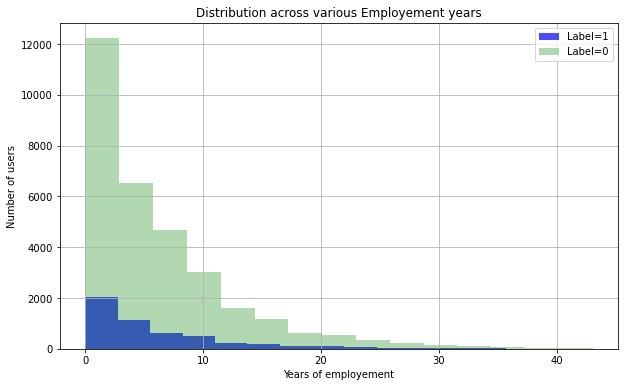

In [43]:
#Distribution of Defaulters across various employement experience groups
plt.figure(figsize=(10,6))
data[data['target']==1]['YEARS_EM'].hist(alpha=0.7,color='blue',
                                              bins=15,label='Label=1')
data[data['target']==0]['YEARS_EM'].hist(alpha=0.3,color='green',
                                                bins=15,label='Label=0')
                                                    
plt.title('Distribution across various Employement years')                                                    
plt.legend()
plt.xlabel('Years of employement')
plt.ylabel('Number of users')

In [44]:
data['Age_'] = data.AGE.apply(lambda x : '20 to 30' if x < 30 else ('30 to 40' if (x>30 and x<40) else('40 to 50' if (x>40 and x<50) else '50 and above')))

In [45]:
data['YEARS_EM'].describe()

count    36457.000000
mean         6.028266
std          6.484375
min          0.000000
25%          1.117808
50%          4.252055
75%          8.638356
max         43.049315
Name: YEARS_EM, dtype: float64

In [46]:
data['EXP_'] = data.YEARS_EM.apply(lambda x : 'Retired' if x == 0 else ('< 5' if (x>0 and x<5) else('< 10' if (x>5 and x<10) else '> 10')))

In [47]:
data['AMT_INCOME_TOTAL'].describe()

count    3.645700e+04
mean     1.866857e+05
std      1.017892e+05
min      2.700000e+04
25%      1.215000e+05
50%      1.575000e+05
75%      2.250000e+05
max      1.575000e+06
Name: AMT_INCOME_TOTAL, dtype: float64

In [48]:
#Classifying the amount of income in different bins to standardize the data
data['INCOME'] = data.AMT_INCOME_TOTAL.apply(lambda x : '25000 to 100000' if x <100000 else ('100000 to 200000' if (x>100000 and x<200000) else('200000 to 300000' if (x>200000 and x<300000) else 'above 300000')))

In [49]:
#Converting the count of children user has to integer values
data['CNT_FAM_MEMBERS'] = df['CNT_FAM_MEMBERS'].astype(int) 

### Replacing the strings Yes and No into binary numbers in various columns

In [50]:
data['FLAG_OWN_CAR'] = data['FLAG_OWN_CAR'].replace(['N','Y'],[0,1])
data['FLAG_OWN_REALTY'] = data['FLAG_OWN_REALTY'].replace(['N','Y'],[0,1])
data['CODE_GENDER'] = data['CODE_GENDER'].replace(['F','M'],[0,1])

### Creating and concatenating dummies of various features to convert them to non-string values

In [51]:
Income = pd.get_dummies(data['NAME_INCOME_TYPE'],drop_first=True)
Education = pd.get_dummies(data['NAME_EDUCATION_TYPE'],drop_first=True)
Fam = pd.get_dummies(data['NAME_FAMILY_STATUS'],drop_first=True)
House = pd.get_dummies(data['NAME_HOUSING_TYPE'],drop_first=True)
Age = pd.get_dummies(data['Age_'],prefix = 'Age_',drop_first=True)
Amt = pd.get_dummies(data['INCOME'],prefix = 'Income',drop_first=True)
Exp = pd.get_dummies(data['EXP_'],prefix = 'Exp_',drop_first=True)
data = pd.concat([data,Income,Education,Fam,House,Age,Exp,Amt],axis=1)
data.head()

,ID,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,...,With parents,Age__30 to 40,Age__40 to 50,Age__50 and above,Exp__< 5,Exp__> 10,Exp__Retired,Income_200000 to 300000,Income_25000 to 100000,Income_above 300000
0,5008804,1,1,1,0,427500.0,Working,Higher education,Civil marriage,Rented apartment,...,0,1,0,0,0,1,0,0,0,1
1,5008805,1,1,1,0,427500.0,Working,Higher education,Civil marriage,Rented apartment,...,0,1,0,0,0,1,0,0,0,1
2,5008806,1,1,1,0,112500.0,Working,Secondary / secondary special,Married,House / apartment,...,0,0,0,1,1,0,0,0,0,0
3,5008808,0,0,1,0,270000.0,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,...,0,0,0,1,0,0,0,1,0,0
4,5008809,0,0,1,0,270000.0,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,...,0,0,0,1,0,0,0,1,0,0


In [52]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 36457 entries, 0 to 36456
Data columns (total 49 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   ID                             36457 non-null  int64  
 1   CODE_GENDER                    36457 non-null  int64  
 2   FLAG_OWN_CAR                   36457 non-null  int64  
 3   FLAG_OWN_REALTY                36457 non-null  int64  
 4   CNT_CHILDREN                   36457 non-null  int64  
 5   AMT_INCOME_TOTAL               36457 non-null  float64
 6   NAME_INCOME_TYPE               36457 non-null  object 
 7   NAME_EDUCATION_TYPE            36457 non-null  object 
 8   NAME_FAMILY_STATUS             36457 non-null  object 
 9   NAME_HOUSING_TYPE              36457 non-null  object 
 10  FLAG_MOBIL                     36457 non-null  int64  
 11  FLAG_WORK_PHONE                36457 non-null  int64  
 12  FLAG_PHONE                     36457 non-null 

In [53]:
#Dropping duplicate columns
data.drop(['NAME_INCOME_TYPE','NAME_EDUCATION_TYPE','NAME_FAMILY_STATUS','NAME_HOUSING_TYPE','OCCUPATION_TYPE','Age_','EXP_','FLAG_MOBIL','AGE','YEARS_EM','INCOME'],axis=1,inplace=True)

In [54]:
data.drop(['AMT_INCOME_TOTAL'],axis=1,inplace=True)

In [55]:
data.drop(['ID'],axis=1,inplace=True)

In [56]:
#Correlation table between various features
corr=data.corr()
corr

,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,FLAG_WORK_PHONE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,CUST_LIFE,target,...,With parents,Age__30 to 40,Age__40 to 50,Age__50 and above,Exp__< 5,Exp__> 10,Exp__Retired,Income_200000 to 300000,Income_25000 to 100000,Income_above 300000
CODE_GENDER,1.000000,0.361379,-0.050758,0.077690,0.064994,-0.026833,-0.003284,-0.003995,-0.005079,0.000680,...,0.054229,0.054364,0.008964,-0.169948,0.131717,-0.051933,-0.175261,0.129238,-0.154715,0.117563
FLAG_OWN_CAR,0.361379,1.000000,-0.015185,0.105839,0.021644,-0.014019,0.021750,0.005648,0.029627,-0.012684,...,0.020122,0.092326,0.033091,-0.156186,0.084087,-0.015737,-0.157496,0.098114,-0.140483,0.167775
FLAG_OWN_REALTY,-0.050758,-0.015185,1.000000,-0.000575,-0.207732,-0.066601,0.052194,-0.005469,-0.006476,0.006334,...,-0.153855,-0.052223,0.009058,0.094816,-0.032616,-0.026473,0.093109,0.003144,-0.028967,0.017189
CNT_CHILDREN,0.077690,0.105839,-0.000575,1.000000,0.048091,-0.016291,0.015960,0.002236,0.003984,0.010259,...,0.029481,0.349803,-0.000322,-0.350828,0.083970,0.019984,-0.230317,0.008093,-0.043040,0.017152
FLAG_WORK_PHONE,0.064994,0.021644,-0.207732,0.048091,1.000000,0.311644,-0.034838,0.005716,0.009713,-0.013472,...,0.033069,0.077452,0.026879,-0.149953,0.060625,0.067389,-0.242730,-0.024134,0.047352,-0.018954
FLAG_PHONE,-0.026833,-0.014019,-0.066601,-0.016291,0.311644,1.000000,0.010455,-0.004818,0.014893,-0.007629,...,-0.006312,-0.008474,0.007669,0.022628,-0.035446,0.042324,-0.006541,-0.011793,0.017985,0.022400
FLAG_EMAIL,-0.003284,0.021750,0.052194,0.015960,-0.034838,0.010455,1.000000,0.002145,-0.002978,0.008308,...,0.007871,0.034539,-0.010835,-0.078861,0.057958,-0.013788,-0.086316,0.028860,-0.059927,0.069015
CNT_FAM_MEMBERS,-0.003995,0.005648,-0.005469,0.002236,0.005716,-0.004818,0.002145,1.000000,-0.008354,-0.007585,...,-0.007840,-0.000978,0.000432,-0.012885,0.014754,-0.004579,0.003482,-0.015854,-0.003052,-0.014773
CUST_LIFE,-0.005079,0.029627,-0.006476,0.003984,0.009713,0.014893,-0.002978,-0.008354,1.000000,-0.314043,...,-0.023640,0.007360,0.040939,0.018144,-0.089355,0.065080,-0.008017,0.014193,-0.013702,0.016115
target,0.000680,-0.012684,0.006334,0.010259,-0.013472,-0.007629,0.008308,-0.007585,-0.314043,1.000000,...,0.002578,-0.011170,0.005012,-0.007693,0.031306,-0.008619,-0.000173,-0.009904,0.012488,-0.002432


It is seen that the correlation between almost all the features is very low (< 0.1), whereas only in some cases it reaches a maximum of 0.4.

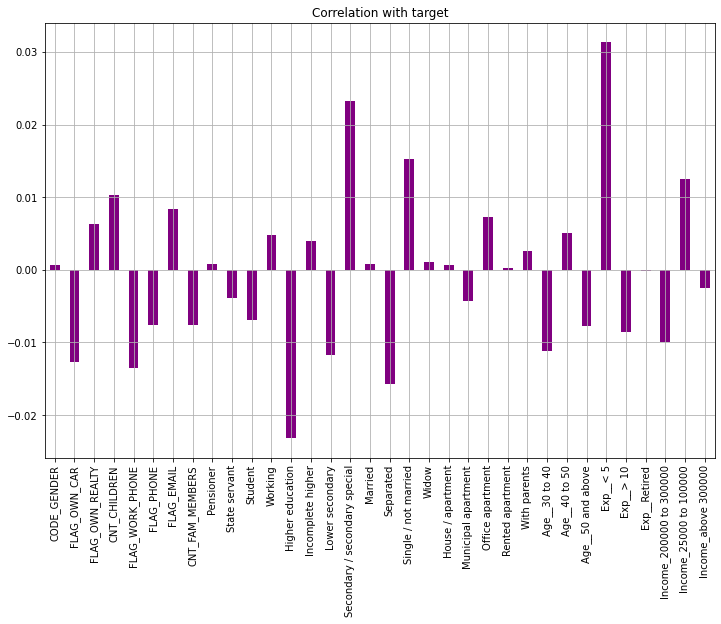

In [57]:
data.drop(['target','CUST_LIFE'], axis=1).corrwith(data.target).plot(kind='bar',color='purple', grid=True, figsize=(12, 8), 
                                                   title="Correlation with target")

It is seen that the correlation of the target variable with the other features is less (<0.04).

### Final Data information before fitting into models

In [58]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 36457 entries, 0 to 36456
Data columns (total 36 columns):
 #   Column                         Non-Null Count  Dtype
---  ------                         --------------  -----
 0   CODE_GENDER                    36457 non-null  int64
 1   FLAG_OWN_CAR                   36457 non-null  int64
 2   FLAG_OWN_REALTY                36457 non-null  int64
 3   CNT_CHILDREN                   36457 non-null  int64
 4   FLAG_WORK_PHONE                36457 non-null  int64
 5   FLAG_PHONE                     36457 non-null  int64
 6   FLAG_EMAIL                     36457 non-null  int64
 7   CNT_FAM_MEMBERS                36457 non-null  int32
 8   CUST_LIFE                      36457 non-null  int64
 9   target                         36457 non-null  int64
 10  Pensioner                      36457 non-null  uint8
 11  State servant                  36457 non-null  uint8
 12  Student                        36457 non-null  uint8
 13  Working         

In [59]:
data['target'].value_counts()

0    31407
1     5050
Name: target, dtype: int64

## Machine Learning Models

In [60]:
X = data.drop('target',axis=1)
y = data['target']
y = y.astype('int')

In [61]:
from sklearn.model_selection import train_test_split

### Splitting the data into test and train, with test data 30% of total and train 70% of total

In [62]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30,random_state = 101)

In [63]:
from sklearn.metrics import classification_report,confusion_matrix

### Logistic Regression Model

In [64]:
from sklearn.linear_model import LogisticRegression

In [65]:
reg = LogisticRegression()

In [66]:
reg.fit(X_train, y_train)

C:\Users\hp\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



LogisticRegression()

In [67]:
pred = reg.predict(X_test)

In [68]:
print(classification_report(y_test,pred))

              precision    recall  f1-score   support

           0       0.87      1.00      0.93      9492
           1       1.00      0.00      0.00      1446

    accuracy                           0.87     10938
   macro avg       0.93      0.50      0.47     10938
weighted avg       0.89      0.87      0.81     10938



In [69]:
print(confusion_matrix(y_test,pred))

[[9492    0]
 [1444    2]]


The data has been mostly converted to categorical, hence the linear models won't work as effectively on these features as compared to continuous data.

### Decision Tree Classifier

In [70]:
from sklearn import tree
from sklearn.tree import DecisionTreeClassifier

In [71]:
dtree = DecisionTreeClassifier()

In [72]:
dtree.fit(X_train,y_train)

DecisionTreeClassifier()

In [73]:
predict = dtree.predict(X_test)

In [74]:
print(classification_report(y_test,predict))

              precision    recall  f1-score   support

           0       0.90      0.88      0.89      9492
           1       0.30      0.33      0.32      1446

    accuracy                           0.81     10938
   macro avg       0.60      0.61      0.60     10938
weighted avg       0.82      0.81      0.81     10938



In [75]:
print(confusion_matrix(y_test,predict))

[[8358 1134]
 [ 962  484]]


### Random Forest Classifier

In [76]:
from sklearn.ensemble import RandomForestClassifier
rfc = RandomForestClassifier(n_estimators=200)
rfc.fit(X_train, y_train)

RandomForestClassifier(n_estimators=200)

In [77]:
rfc_pred = rfc.predict(X_test)

In [78]:
print(confusion_matrix(y_test,rfc_pred))

[[9064  428]
 [1064  382]]


In [79]:
print(classification_report(y_test,rfc_pred))

              precision    recall  f1-score   support

           0       0.89      0.95      0.92      9492
           1       0.47      0.26      0.34      1446

    accuracy                           0.86     10938
   macro avg       0.68      0.61      0.63     10938
weighted avg       0.84      0.86      0.85     10938



### K - Neighbours Classifier

In [80]:
#Here the neighbours are assumed to be '1' for testing purposes
from sklearn.neighbors import KNeighborsClassifier
knn_1 = KNeighborsClassifier(n_neighbors=1)

knn_1.fit(X_train, y_train)
y_pred = knn_1.predict(X_test)

In [81]:
print(confusion_matrix(y_test, y_pred))

[[8438 1054]
 [ 949  497]]


In [82]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.90      0.89      0.89      9492
           1       0.32      0.34      0.33      1446

    accuracy                           0.82     10938
   macro avg       0.61      0.62      0.61     10938
weighted avg       0.82      0.82      0.82     10938



### Gaussian Naive-Bayes Classifier

In [83]:
from sklearn.naive_bayes import GaussianNB

In [84]:
model =  GaussianNB()
model.fit(X_train,y_train)

GaussianNB()

In [85]:
y_pred=model.predict(X_test)

In [86]:
print(confusion_matrix(y_test, y_pred))

[[2205 7287]
 [  86 1360]]


In [87]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.96      0.23      0.37      9492
           1       0.16      0.94      0.27      1446

    accuracy                           0.33     10938
   macro avg       0.56      0.59      0.32     10938
weighted avg       0.86      0.33      0.36     10938



### Gradient Boosting Classifier

In [88]:
from sklearn.ensemble import GradientBoostingClassifier

In [89]:
model =  GradientBoostingClassifier(n_estimators=20,learning_rate=0.10)
model.fit(X_train,y_train)

GradientBoostingClassifier(n_estimators=20)

In [90]:
y_pred=model.predict(X_test)

In [91]:
print(confusion_matrix(y_test, y_pred))

[[9458   34]
 [1388   58]]


In [92]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.87      1.00      0.93      9492
           1       0.63      0.04      0.08      1446

    accuracy                           0.87     10938
   macro avg       0.75      0.52      0.50     10938
weighted avg       0.84      0.87      0.82     10938



###### The data is unbalanced with more number of non - defaulters as compared to defaulters

## Random Under Sampling

In [93]:
count_reject, count_accept = data.target.value_counts()

In [94]:
df_reject = data[data['target'] == 0]
df_accept = data[data['target'] == 1]

Count of the data is taken and the data has been classified in different dataframes

In [95]:
df_reject_under = df_reject.sample(count_accept,replace=True)

In [96]:
df_test_under = pd.concat([df_accept,df_reject_under],axis=0)

In [97]:
df_test_under.head()

,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,FLAG_WORK_PHONE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,CUST_LIFE,target,...,With parents,Age__30 to 40,Age__40 to 50,Age__50 and above,Exp__< 5,Exp__> 10,Exp__Retired,Income_200000 to 300000,Income_25000 to 100000,Income_above 300000
10,1,1,1,0,1,1,1,2,5,1,...,0,0,1,0,1,0,0,1,0,0
17,1,1,1,0,0,0,0,2,3,1,...,0,0,1,0,1,0,0,0,0,0
18,0,1,0,0,0,0,0,2,25,1,...,0,0,0,0,1,0,0,0,0,0
31,1,0,1,1,0,0,0,3,8,1,...,0,1,0,0,0,0,0,0,0,1
34,1,1,1,0,0,1,0,3,11,1,...,0,0,0,1,0,1,0,0,0,0


In [98]:
df_test_under['target'].value_counts()

1    5050
0    5050
Name: target, dtype: int64

The Data has been randomly under-sampled to have same count of both defaulters and non defaulters

In [99]:
X = df_test_under.drop('target',axis=1)
y = df_test_under['target']

In [100]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30,random_state=101)

### Decision Tree Classifier

In [101]:
dtree = DecisionTreeClassifier()

In [102]:
dtree.fit(X_train,y_train)

DecisionTreeClassifier()

In [103]:
predictions = dtree.predict(X_test)

In [104]:
print(classification_report(y_test,predictions))

              precision    recall  f1-score   support

           0       0.65      0.63      0.64      1502
           1       0.64      0.66      0.65      1528

    accuracy                           0.65      3030
   macro avg       0.65      0.65      0.65      3030
weighted avg       0.65      0.65      0.65      3030



In [105]:
print(confusion_matrix(y_test,predictions))

[[ 947  555]
 [ 520 1008]]


### Random Forest Classifier

In [106]:
rfc = RandomForestClassifier(n_estimators=150)
rfc.fit(X_train, y_train)

RandomForestClassifier(n_estimators=150)

In [107]:
rfc_pred = rfc.predict(X_test)

In [108]:
print(confusion_matrix(y_test,rfc_pred))

[[1116  386]
 [ 385 1143]]


In [109]:
print(classification_report(y_test,rfc_pred))

              precision    recall  f1-score   support

           0       0.74      0.74      0.74      1502
           1       0.75      0.75      0.75      1528

    accuracy                           0.75      3030
   macro avg       0.75      0.75      0.75      3030
weighted avg       0.75      0.75      0.75      3030



### Gradient Boosting Classifier

In [110]:
model =  GradientBoostingClassifier(n_estimators=20,learning_rate=0.10)
model.fit(X_train,y_train)

GradientBoostingClassifier(n_estimators=20)

In [111]:
y_pred=model.predict(X_test)

In [112]:
print(confusion_matrix(y_test, y_pred))

[[1157  345]
 [ 543  985]]


In [113]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.68      0.77      0.72      1502
           1       0.74      0.64      0.69      1528

    accuracy                           0.71      3030
   macro avg       0.71      0.71      0.71      3030
weighted avg       0.71      0.71      0.71      3030



## Random Over Sampling

In [114]:
count_reject, count_accept = data.target.value_counts()

In [115]:
df_reject = data[data['target'] == 0]
df_accept = data[data['target'] == 1]

Count of the data is taken and the data has been classified in different dataframes

In [116]:
df_accept_over = df_accept.sample(count_reject,replace=True)

In [117]:
df_test_over = pd.concat([df_reject,df_accept_over],axis=0)

In [118]:
df_test_over.head()

,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,FLAG_WORK_PHONE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,CUST_LIFE,target,...,With parents,Age__30 to 40,Age__40 to 50,Age__50 and above,Exp__< 5,Exp__> 10,Exp__Retired,Income_200000 to 300000,Income_25000 to 100000,Income_above 300000
0,1,1,1,0,1,0,0,2,15,0,...,0,1,0,0,0,1,0,0,0,1
1,1,1,1,0,1,0,0,2,14,0,...,0,1,0,0,0,1,0,0,0,1
2,1,1,1,0,0,0,0,2,29,0,...,0,0,0,1,1,0,0,0,0,0
3,0,0,1,0,0,1,1,1,4,0,...,0,0,0,1,0,0,0,1,0,0
4,0,0,1,0,0,1,1,1,26,0,...,0,0,0,1,0,0,0,1,0,0


In [119]:
df_test_over['target'].value_counts()

1    31407
0    31407
Name: target, dtype: int64

The Data has been randomly over-sampled to have same count of both defaulters and non defaulters

In [120]:
X = df_test_over.drop('target',axis=1)
y = df_test_over['target']

In [121]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30,random_state=101)

### Decision Tree Classifier

In [122]:
dtree = DecisionTreeClassifier()

In [123]:
dtree.fit(X_train,y_train)

DecisionTreeClassifier()

In [124]:
predictions = dtree.predict(X_test)

In [125]:
print(classification_report(y_test,predictions))

              precision    recall  f1-score   support

           0       0.98      0.84      0.90      9441
           1       0.86      0.98      0.92      9404

    accuracy                           0.91     18845
   macro avg       0.92      0.91      0.91     18845
weighted avg       0.92      0.91      0.91     18845



In [126]:
print(confusion_matrix(y_test,predictions))

[[7913 1528]
 [ 174 9230]]


### K - Neighbours Classifier

In [127]:
knn_1 = KNeighborsClassifier(n_neighbors=2)

knn_1.fit(X_train, y_train)
y_pred = knn_1.predict(X_test)

In [128]:
print(confusion_matrix(y_test, y_pred))

[[8111 1330]
 [ 726 8678]]


In [129]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.92      0.86      0.89      9441
           1       0.87      0.92      0.89      9404

    accuracy                           0.89     18845
   macro avg       0.89      0.89      0.89     18845
weighted avg       0.89      0.89      0.89     18845



### Gradient Boosting Classifier

In [130]:
model =  GradientBoostingClassifier(n_estimators=20,learning_rate=0.10)
model.fit(X_train,y_train)

GradientBoostingClassifier(n_estimators=20)

In [131]:
y_pred=model.predict(X_test)

In [132]:
print(confusion_matrix(y_test, y_pred))

[[7579 1862]
 [3347 6057]]


In [133]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.69      0.80      0.74      9441
           1       0.76      0.64      0.70      9404

    accuracy                           0.72     18845
   macro avg       0.73      0.72      0.72     18845
weighted avg       0.73      0.72      0.72     18845



##### Checking for the best estimator value for the random forest classifier

In [134]:
for i in range(149,351,50):
    print(f" trying model with {i} estimators..")
    clf = RandomForestClassifier(n_estimators=i).fit(X_train,y_train)
    print(f" accuracy:{clf.score(X_test, y_test)*100}%")
    print("")

 trying model with 149 estimators..
 accuracy:93.74900504112496%

 trying model with 199 estimators..
 accuracy:93.74369859379146%

 trying model with 249 estimators..
 accuracy:93.87635977712921%

 trying model with 299 estimators..
 accuracy:93.73839214645795%

 trying model with 349 estimators..
 accuracy:93.74369859379146%



We see that for values between 150 to 250 are the best fir for the model.

### Random Forest Classifier

In [135]:
rfc = RandomForestClassifier(n_estimators=150)
rfc.fit(X_train, y_train)

RandomForestClassifier(n_estimators=150)

In [136]:
rfc_pred = rfc.predict(X_test)

In [137]:
print(confusion_matrix(y_test,rfc_pred))

[[8378 1063]
 [ 102 9302]]


In [138]:
print(classification_report(y_test,rfc_pred))

              precision    recall  f1-score   support

           0       0.99      0.89      0.93      9441
           1       0.90      0.99      0.94      9404

    accuracy                           0.94     18845
   macro avg       0.94      0.94      0.94     18845
weighted avg       0.94      0.94      0.94     18845



### From the analysis we can see that over sampling technique yeilds better results for the dataset than under-sampling

### The best model for the dataset will be the random forest classifier as it gives the highest f1 scores for all the features and predicts the best outcome.

### The highest model accuracy can be seen as 94% from the random forest classifier after over-sampling the data.